In [53]:
import sys, os
sys.path.append(os.path.abspath('..'))
%load_ext autoreload
%autoreload 2

from modules.config import *
from modules import h3_visualization

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [54]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import geopandas as gpd
import h3
from shapely.geometry import shape, Polygon
import shapely
import folium
import json

In [55]:
# comment out if you want to burn your eyes
plt.style.use('dark_background')

In [62]:
availability_all = pd.read_parquet(AVAILABILITY_PATH)

In [63]:
availability_all.head()

n_bikes
h3_res time_interval_length datetime   hex_id                  
8      1                    2019-01-01 881f1a1401fffff        0
                                       881f1a140bfffff        0
                                       881f1a1441fffff        0
                                       881f1a1443fffff        0
                                       881f1a1445fffff        0

In [82]:
availability_all.xs((9,1)).n_bikes.max()

53

In [97]:
availability = availability_all.xs((9,1)).reset_index()

In [100]:
av_per_hex = availability.groupby('hex_id').mean()

In [101]:
h3_visualization.plot_choropleth(
    av_per_hex.reset_index(),
    hex_col="hex_id",
    color_by_col="n_bikes",

    hover_name="hex_id",
    hover_data=['n_bikes'],
    labels={'n_bikes': '# available bikes'},
    opacity=0.7,
    color_continuous_scale="ice",

    zoom=10,
    width=800,
    height=600,
    center={"lat": 51.3397, "lon": 12.3731},
    mapbox_style="open-street-map",
)


In [29]:
availability_daily_hex = availability.set_index(["hex_id", "datetime"]).groupby(
    [pd.Grouper(level="hex_id"), pd.Grouper(level="datetime", freq="M")]
).sum().reset_index()
availability_daily_hex.head(2)

,hex_id,datetime,n_bikes
0,881f1a1401fffff,2019-01-31,0
1,881f1a1401fffff,2019-02-28,0


In [30]:
availability_daily_hex['month'] = availability_daily_hex.datetime.dt.month

In [32]:
# only for vscode
# https://github.com/microsoft/vscode-jupyter/issues/4364#issuecomment-817352686
import plotly.io as pio
pio.renderers.default = 'notebook_connected'

In [33]:
h3_visualization.plot_choropleth(
    availability_daily_hex.reset_index(),
    hex_col="hex_id",
    color_by_col="n_bikes",
	animation_frame="month",

    hover_data=['n_bikes'],
    labels={'n_bikes': '# available bikes'},

    opacity=0.7,
    color_continuous_scale="ice",


    center={"lat": 51.3397, "lon": 12.3731},
    height=600,
    width=800,
	zoom=10,
    mapbox_style="open-street-map",
)


In [34]:
availability_daily = availability.groupby('datetime')['n_bikes'].sum().resample('D').sum()

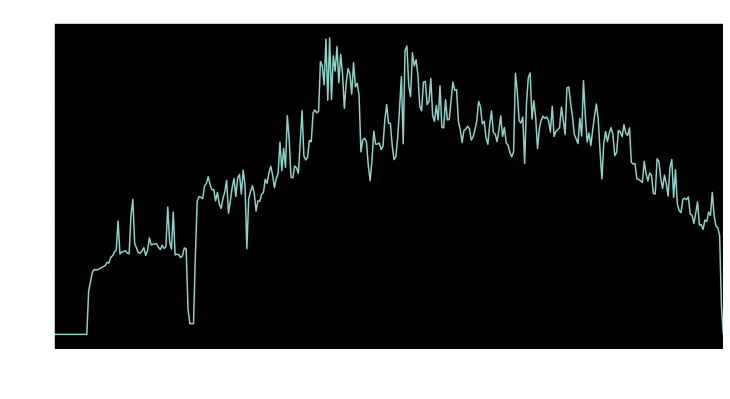

In [35]:
fig, ax = plt.subplots(figsize=(12, 6))
availability_daily.plot(ax=ax)
ax.set_ylabel('Number of bikes')
ax.set_xlabel('Date')
ax.set_title('Daily availability')
plt.show()